In [191]:
# !pip install hdbscan

In [192]:
import pandas as pd
from IPython.display import display, HTML
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN
from sklearn.neighbors import DistanceMetric
from scipy.spatial.distance import pdist
from sklearn.metrics import pairwise_distances

In [193]:
print(os.listdir("../input/doenca-cardio"))

['classificados_por_padroes_de_doenca_estatistica.csv']


# Load the dataset

In [194]:
df = pd.read_csv("../input/doenca-cardio/classificados_por_padroes_de_doenca_estatistica.csv", delimiter=";")
display(HTML(df.to_html()))

,numero_identificacao,genero,sist 9:00,sist 9:15,sist 9:30,sist 9:45,sist 10:00,sist 10:15,sist 10:30,sist 10:45,sist 11:00,sist 11:15,sist 11:30,sist 11:45,sist 12:00,sist 12:15,sist 12:30,sist 12:45,sist 13:00,sist 13:15,sist 13:30,sist 13:45,sist 14:00,sist 14:15,sist 14:30,sist 14:45,sist 15:00,sist 15:15,sist 15:30,sist 15:45,sist 16:00,sist 16:15,sist 16:30,sist 16:45,sist 17:00,sist 17:15,sist 17:30,sist 17:45,sist 18:00,sist 18:15,sist 18:30,sist 18:45,sist 19:00,sist 19:15,sist 19:30,sist 19:45,sist 20:00,sist 20:15,sist 20:30,sist 20:45,sist 21:00,sist 21:15,sist 21:30,sist 21:45,sist 22:00,sist 22:15,sist 22:30,sist 22:45,sist 23:00,sist 23:30,sist 0:00,sist 0:30,sist 1:00,sist 1:30,sist 2:00,sist 2:30,sist 3:00,sist 3:30,sist 4:00,sist 4:30,sist 5:00,sist 5:30,sist 6:00,sist 6:30,sist 7:00,sist 7:15,sist 7:30,sist 7:45,sist 8:00,sist 8:15,sist 8:30,sist 8:45,diast 9:00,diast 9:15,diast 9:30,diast 9:45,diast 10:00,diast 10:15,diast 10:30,diast 10:45,diast 11:00,diast 11:15,diast 11:30,diast 11:45,diast 12:00,diast 12:15,diast 12:30,diast 12:45,diast 13:00,diast 13:15,diast 13:30,diast 13:45,diast 14:00,diast 14:15,diast 14:30,diast 14:45,diast 15:00,diast 15:15,diast 15:30,diast 15:45,diast 16:00,diast 16:15,diast 16:30,diast 16:45,diast 17:00,diast 17:15,diast 17:30,diast 17:45,diast 18:00,diast 18:15,diast 18:30,diast 18:45,diast 19:00,diast 19:15,diast 19:30,diast 19:45,diast 20:00,diast 20:15,diast 20:30,diast 20:45,diast 21:00,diast 21:15,diast 21:30,diast 21:45,diast 22:00,diast 22:15,diast 22:30,diast 22:45,diast 23:00,diast 23:30,diast 0:00,diast 0:30,diast 1:00,diast 1:30,diast 2:00,diast 2:30,diast 3:00,diast 3:30,diast 4:00,diast 4:30,diast 5:00,diast 5:30,diast 6:00,diast 6:30,diast 7:00,diast 7:15,diast 7:30,diast 7:45,diast 8:00,diast 8:15,diast 8:30,diast 8:45,Hipotensao,Sistolica Isolada,Diastolica Isolada,Dipping,Non Dipping,Extreme Dipping,Reverse Dipping,Morning Surge,Masked,Normotenso,Media Sistolica,Media Diastolica,Variancia Sistolica,Variancia Diastolica,Mediana Sistolica,Mediana Diastolica,AUC Sistolica,AUC Diastolica,AUC PP Dia,AUC PP Noite,DP Sistolica,DP Diastolica,Picos Sistolica,Picos Diastolica
0,7,F,140.0,139.0,142.0,137.0,135.0,177.0,148.0,152.0,135.0,136.0,130.0,159.0,147.0,146.0,150.0,157.0,144.0,137.0,74.0,121.0,131.0,135.0,123.0,122.0,113.0,140.0,142.0,139.0,142.0,139.0,140.0,137.0,128.0,126.0,122.0,118.0,140.0,127.0,129.0,114.0,113.0,137.0,124.0,135.0,127.0,127.0,137.0,131.0,131.0,132.0,136.0,131.0,126.0,127.0,144.0,152.0,129.0,120.0,117.0,115.0,110.0,123.0,128.0,113.0,114.0,141.0,127.0,123.0,119.0,117.0,135.0,96.0,111.0,128.0,145.0,141.0,147.0,153.0,153.0,185.0,81.0,90.0,90.0,89.0,83.0,93.0,85.0,88.0,77.0,84.0,84.0,85.0,90.0,85.0,98.0,86.0,84.0,81.0,58.0,80.0,78.0,86.0,67.0,66.0,66.0,82.0,81.0,81.0,69.0,69.0,89.0,96.0,74.0,79.0,75.0,74.0,78.0,71.0,75.0,65.0,72.0,86.0,75.0,81.0,82.0,65.0,87.0,82.0,87.0,79.0,77.0,80.0,73.0,80.0,95.0,92.0,78.0,72.0,60.0,64.0,62.0,74.0,74.0,71.0,67.0,87.0,89.0,90.0,80.0,83.0,79.0,49.0,62.0,83.0,104.0,82.0,85.5,89.0,90.0,72.0,True,False,False,True,False,False,False,True,False,False,132.66,79.39,250.60,97.94,133.50,81.00,10450.5,6275.0,3557.00,602.50,15.83,9.90,23,8
1,10,M,122.0,119.0,117.0,115.0,110.0,108.0,120.0,116.0,135.0,126.0,125.0,124.0,126.0,127.0,127.0,121.0,121.0,119.0,118.0,125.0,130.0,145.0,135.0,132.0,125.0,119.0,127.0,129.0,136.0,132.0,133.0,130.0,133.0,127.0,126.0,131.0,124.0,124.0,135.0,130.0,127.0,120.0,124.0,118.0,120.0,118.0,121.0,122.0,119.0,124.0,119.0,118.0,112.0,112.0,107.0,119.0,114.0,99.0,119.0,132.0,130.0,116.0,101.0,108.0,108.0,110.0,114.0,125.0,156.0,151.0,99.0,106.0,104.5,103.0,109.0,117.0,131.0,128.0,128.5,129.0,79.0,72.0,69.0,70.0,63.0,66.0,65.0,68.0,81.0,77.0,74.0,80.0,76.0,90.0,80.0,84.0,78.0,87.0,84.0,81.0,61.0,91.0,85.0,78.0,76.0,74.0,81.0,83.0,84.0,86.0,75.0,76.0,79.0,74.0,78.0,94.0,79.0,90.0,88.0,76.0,72.0,68.0,66.0,67.0,67.0,66.0,75.0,74.0,75.0,73.0,76.0,73.0,76.0,71.0,67.0,80.0,67.0,69.0,81.0,87.0,93.0,77.0,57.0,

In [195]:
# drop all averages, standard deviations, and classes (types of diseases)
df = df.iloc[:,:162]
display(HTML(df.to_html()))

,numero_identificacao,genero,sist 9:00,sist 9:15,sist 9:30,sist 9:45,sist 10:00,sist 10:15,sist 10:30,sist 10:45,sist 11:00,sist 11:15,sist 11:30,sist 11:45,sist 12:00,sist 12:15,sist 12:30,sist 12:45,sist 13:00,sist 13:15,sist 13:30,sist 13:45,sist 14:00,sist 14:15,sist 14:30,sist 14:45,sist 15:00,sist 15:15,sist 15:30,sist 15:45,sist 16:00,sist 16:15,sist 16:30,sist 16:45,sist 17:00,sist 17:15,sist 17:30,sist 17:45,sist 18:00,sist 18:15,sist 18:30,sist 18:45,sist 19:00,sist 19:15,sist 19:30,sist 19:45,sist 20:00,sist 20:15,sist 20:30,sist 20:45,sist 21:00,sist 21:15,sist 21:30,sist 21:45,sist 22:00,sist 22:15,sist 22:30,sist 22:45,sist 23:00,sist 23:30,sist 0:00,sist 0:30,sist 1:00,sist 1:30,sist 2:00,sist 2:30,sist 3:00,sist 3:30,sist 4:00,sist 4:30,sist 5:00,sist 5:30,sist 6:00,sist 6:30,sist 7:00,sist 7:15,sist 7:30,sist 7:45,sist 8:00,sist 8:15,sist 8:30,sist 8:45,diast 9:00,diast 9:15,diast 9:30,diast 9:45,diast 10:00,diast 10:15,diast 10:30,diast 10:45,diast 11:00,diast 11:15,diast 11:30,diast 11:45,diast 12:00,diast 12:15,diast 12:30,diast 12:45,diast 13:00,diast 13:15,diast 13:30,diast 13:45,diast 14:00,diast 14:15,diast 14:30,diast 14:45,diast 15:00,diast 15:15,diast 15:30,diast 15:45,diast 16:00,diast 16:15,diast 16:30,diast 16:45,diast 17:00,diast 17:15,diast 17:30,diast 17:45,diast 18:00,diast 18:15,diast 18:30,diast 18:45,diast 19:00,diast 19:15,diast 19:30,diast 19:45,diast 20:00,diast 20:15,diast 20:30,diast 20:45,diast 21:00,diast 21:15,diast 21:30,diast 21:45,diast 22:00,diast 22:15,diast 22:30,diast 22:45,diast 23:00,diast 23:30,diast 0:00,diast 0:30,diast 1:00,diast 1:30,diast 2:00,diast 2:30,diast 3:00,diast 3:30,diast 4:00,diast 4:30,diast 5:00,diast 5:30,diast 6:00,diast 6:30,diast 7:00,diast 7:15,diast 7:30,diast 7:45,diast 8:00,diast 8:15,diast 8:30,diast 8:45
0,7,F,140.0,139.0,142.0,137.0,135.0,177.0,148.0,152.0,135.0,136.0,130.0,159.0,147.0,146.0,150.0,157.0,144.0,137.0,74.0,121.0,131.0,135.0,123.0,122.0,113.0,140.0,142.0,139.0,142.0,139.0,140.0,137.0,128.0,126.0,122.0,118.0,140.0,127.0,129.0,114.0,113.0,137.0,124.0,135.0,127.0,127.0,137.0,131.0,131.0,132.0,136.0,131.0,126.0,127.0,144.0,152.0,129.0,120.0,117.0,115.0,110.0,123.0,128.0,113.0,114.0,141.0,127.0,123.0,119.0,117.0,135.0,96.0,111.0,128.0,145.0,141.0,147.0,153.0,153.0,185.0,81.0,90.0,90.0,89.0,83.0,93.0,85.0,88.0,77.0,84.0,84.0,85.0,90.0,85.0,98.0,86.0,84.0,81.0,58.0,80.0,78.0,86.0,67.0,66.0,66.0,82.0,81.0,81.0,69.0,69.0,89.0,96.0,74.0,79.0,75.0,74.0,78.0,71.0,75.0,65.0,72.0,86.0,75.0,81.0,82.0,65.0,87.0,82.0,87.0,79.0,77.0,80.0,73.0,80.0,95.0,92.0,78.0,72.0,60.0,64.0,62.0,74.0,74.0,71.0,67.0,87.0,89.0,90.0,80.0,83.0,79.0,49.0,62.0,83.0,104.0,82.0,85.5,89.0,90.0,72.0
1,10,M,122.0,119.0,117.0,115.0,110.0,108.0,120.0,116.0,135.0,126.0,125.0,124.0,126.0,127.0,127.0,121.0,121.0,119.0,118.0,125.0,130.0,145.0,135.0,132.0,125.0,119.0,127.0,129.0,136.0,132.0,133.0,130.0,133.0,127.0,126.0,131.0,124.0,124.0,135.0,130.0,127.0,120.0,124.0,118.0,120.0,118.0,121.0,122.0,119.0,124.0,119.0,118.0,112.0,112.0,107.0,119.0,114.0,99.0,119.0,132.0,130.0,116.0,101.0,108.0,108.0,110.0,114.0,125.0,156.0,151.0,99.0,106.0,104.5,103.0,109.0,117.0,131.0,128.0,128.5,129.0,79.0,72.0,69.0,70.0,63.0,66.0,65.0,68.0,81.0,77.0,74.0,80.0,76.0,90.0,80.0,84.0,78.0,87.0,84.0,81.0,61.0,91.0,85.0,78.0,76.0,74.0,81.0,83.0,84.0,86.0,75.0,76.0,79.0,74.0,78.0,94.0,79.0,90.0,88.0,76.0,72.0,68.0,66.0,67.0,67.0,66.0,75.0,74.0,75.0,73.0,76.0,73.0,76.0,71.0,67.0,80.0,67.0,69.0,81.0,87.0,93.0,77.0,57.0,68.0,73.0,75.0,76.0,85.0,90.0,96.0,61.0,60.0,50.0,40.0,67.0,69.0,97.0,95.0,93.5,92.0
2,44,M,126.0,121.0,125.0,120.0,119.0,140.0,110.0,115.0,115.0,106.0,115.0,115.0,117.0,115.0,108.0,109.0,112.0,115.0,110.0,118.0,113.0,107.0,120.0,115.0,115.0,116.0,113.0,115.0,124.0,120.0,125.0,121.0,124.0,122.0,120.0,123.0,112.0,112.0,118.0,139.0,116.0,119.0,122.0,116.0,109.0,119.0,111.0,105.0,113.0,107.0,105.0,109.0,112.0,111.0,108.0,109.0,110.0,111.0,118.0,106.0,115.0,117.0,117.0,108.0,115.0,125.0,107.0,118.

In [196]:
# transform M and F to binary 
cleanup_nums = {"genero": {"M": True, "F": False}}

df.replace(cleanup_nums, inplace=True)
df = df.astype(int)

In [197]:
# remove numero_identificacao
df = df.iloc[:, 1:]
df.head()

,genero,sist 9:00,sist 9:15,sist 9:30,sist 9:45,sist 10:00,sist 10:15,sist 10:30,sist 10:45,sist 11:00,...,diast 6:00,diast 6:30,diast 7:00,diast 7:15,diast 7:30,diast 7:45,diast 8:00,diast 8:15,diast 8:30,diast 8:45
0,0,140,139,142,137,135,177,148,152,135,...,79,49,62,83,104,82,85,89,90,72
1,1,122,119,117,115,110,108,120,116,135,...,61,60,50,40,67,69,97,95,93,92
2,1,126,121,125,120,119,140,110,115,115,...,87,88,91,82,88,88,89,84,83,86
3,0,144,148,128,125,116,129,138,128,121,...,54,46,58,67,79,72,62,63,59,81
4,1,129,126,116,122,129,145,141,134,138,...,57,60,65,63,61,55,68,75,82,91


In [198]:
# split between train and test with test_size of 0.3 (30%)
Xtrain, Xtest = train_test_split(df, test_size=0.3, random_state=42)

display(Xtrain.head())

display(Xtest.head())

,genero,sist 9:00,sist 9:15,sist 9:30,sist 9:45,sist 10:00,sist 10:15,sist 10:30,sist 10:45,sist 11:00,...,diast 6:00,diast 6:30,diast 7:00,diast 7:15,diast 7:30,diast 7:45,diast 8:00,diast 8:15,diast 8:30,diast 8:45
357,1,126,141,133,141,139,137,156,140,125,...,52,58,47,47,53,44,50,52,72,64
648,0,112,114,124,151,147,113,122,153,137,...,57,70,80,85,78,83,95,75,84,85
291,0,134,137,140,137,127,122,136,154,127,...,84,68,67,72,64,63,75,83,83,100
420,0,117,141,118,154,124,145,135,175,147,...,49,51,78,80,73,75,73,78,81,79
177,1,122,114,139,131,125,125,132,124,137,...,64,65,80,79,85,80,83,79,84,82


,genero,sist 9:00,sist 9:15,sist 9:30,sist 9:45,sist 10:00,sist 10:15,sist 10:30,sist 10:45,sist 11:00,...,diast 6:00,diast 6:30,diast 7:00,diast 7:15,diast 7:30,diast 7:45,diast 8:00,diast 8:15,diast 8:30,diast 8:45
158,0,122,122,120,130,123,126,129,111,115,...,45,50,52,59,57,63,53,69,70,59
499,0,116,116,112,110,108,130,112,115,109,...,58,49,56,63,68,65,58,63,64,61
396,1,132,128,126,117,136,142,140,135,138,...,66,94,83,84,87,84,96,86,92,97
155,1,117,119,120,113,118,117,127,121,127,...,57,61,64,78,79,81,85,98,86,86
321,0,94,110,97,110,103,149,135,161,156,...,71,77,78,76,77,77,81,84,59,52


In [199]:
# computer distances 
pdist = pairwise_distances(Xtrain, metric='mahalanobis', VI = 1/(np.cov(Xtrain)))
# pdist = pairwise_distances(Xtrain, metric='euclidean')

display(HTML(pd.DataFrame(pdist).to_html()))
# print(pdist.shape)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488
0,0.000000,7.607024,114.218956,23.750622,74.985975,144.293282,16.211012,49.410188,2.989827,45.187775,44.625970,68.899926,59.687993,132.660983,22.315584,40.456301,33.185775,31.931207,117.092020,21.764728,4.564190,17.778632,32.066352,86.109258,123.625119,27.654790,125.598141,12.565263,52.107644,60.966843,24.679598,16.507738,53.419438,74.995694,54.269486,47.478296,36.831128,2.955074,152.184131,88.169178,120.069360,18.857231,8.946220,NaN,15.630162,6.913429,56.771842,80.234413,89.644523,48.087018,NaN,122.060072,20.259866,40.135806,82.448016,38.085400,40.046529,165.058267,NaN,125.788047,50.636567,174.144478,114.599539,60.596114,69.080212,80.483821,17.707429,30.495684,42.702424,107.847827,8.216323,79.214132,77.455366,24.425662,44.512299,51.107915,54.966032,7.388329,72.725657,60.140267,14.390459,27.360646,124.340330,61.943448,16.867421,40.459753,76.066859,9.276776,45.912517,27.652454,126.351721,103.433885,52.853789,157.020797,11.556989,3.805567,33.213084,43.639046,13.978663,33.643715,68.406898,90.728400,85.670590,238.902018,51.319301,116.930637,229.657546,27.927892,3.435351,2.647072,3.119069,22.866236,11.693303,138.452848,6.570761,103.599744,118.101102,217.605763,51.788792,74.910672,4.870739,54.839452,29.448847,8.723869,103.897245,17.487604,NaN,NaN,55.937334,50.898134,12.060405,159.790503,63.095825,54.561096,124.967547,156.613490,84.432237,24.210320,111.144820,16.689336,60.512712,163.822772,23.039772,12.910634,16.126597,18.443370,41.707478,25.502323,280.214509,38.185790,58.799720,69.339211,77.579654,71.992358,162.532775,50.353035,65.253936,11.213848,21.577742,112.209609,50.063223,47.836718,9.618097,38.901264,33.570560,103.381955,23.278592,41.763709,113.278266,7.987841,68.081939,1.781633,152.487173,16.192076,225.474606,126.849256,45.968328,2.980124,65.709584,51.720051,6.475023,91.447489,134.794800,60.950373,71.602836,197.537945,63.366087,62.497001,150.550280,31.603019,28.750510,78.556928,24.954602,21.146585,18.730898,63.388621,NaN,103.897503,18.743251,14.199103,NaN,89.767350,43.780785,43.805000,78.065972,44.691651,6.811953,16.954654,63.409497,111.070792,53.010236,31.627947,106.758583,135.641120,34.710426,42.598185,NaN,63.547

In [200]:
import hdbscan

In [201]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, metric='precomputed')
clustering.fit(np.nan_to_num(pdist))

# clustering = DBSCAN(eps=3, min_samples=2, metric='precomputed').fit(np.nan_to_num(pdist))

print(len(clustering.labels_))
print(clustering.labels_)

489
[ 8  8  9  8  8  9 -1  8  8  8  8  8  8 -1  8  8  6  8  9  8  8  8  6  8
  9  8  9  8  8  8  8  8  8  8  8  8  6  8  7  8  9  8  8  8  8  8  8  8
  8  8  8  9  8  8 -1  8  8  4  8  9  8  4  9  5  8  8  8  8  8 -1  8  8
  8  8  8  8  8  8  8  8  8  8  9  8  8  6 -1  8  8  8  9  8  8  7  8  8
  8  8  8  8  8  8  8  1 -1  9  1  8  8  8  8  8  8  9  8  8  9  1  8  8
  8  8  8  8  8  8  8  8  8  8  8 -1  8  8  9 -1  8  8  9  8  8  7  8  8
  8  8  8  8  0  8  8  8  8  8 -1  6  8  8  8  9  8  6  8  6  8  8  8  8
  9  8  8  8  7  8  1  9  6  8  8  8  8  8  9  8  8  3  8 -1  7  6  8  8
  8  8  8  5  8  8  8  8  8  8  8  8  8  8  8  8  8  9  6  8  8  9  8  8
  8  8  8  8  8  8  8  9  6  8  8  4  5  8  6  8  8  8  8  8  8  8  8  8
  8  3  8  8  8  9  8  8  8  8  8  8  8  8  8  8  8  8  8  2  8  8  8  8
  8  9  8  8  8  6  8  8  8  8  8  8  8  8  9  4  9  8  8  8  9  8  8  4
  5  8  8  8  8  9  8  8  8  8  8  8  8  8  8  8  9  9  2  8  6  8  8  8
  8  8  6  9  8  8  8  8  5  8  8  8  8  8  9  

In [202]:
print(np.unique(clustering.labels_))
print(clustering.labels_.max())

inds = list()
clusters = np.unique(clustering.labels_)
print(clusters)

for i in clusters:
    inds.append(np.where(clustering.labels_ == i)[0])

[-1  0  1  2  3  4  5  6  7  8  9]
9
[-1  0  1  2  3  4  5  6  7  8  9]


In [203]:
inds

[array([  6,  13,  54,  69,  86, 104, 131, 135, 154, 187, 333, 336, 354,
        434, 436, 474]),
 array([148, 406, 425]),
 array([103, 106, 117, 174]),
 array([259, 306, 397, 442]),
 array([185, 241, 352, 362, 405]),
 array([ 57,  61, 227, 279, 287, 349, 432]),
 array([ 63, 195, 228, 288, 320, 396, 471]),
 array([ 16,  22,  36,  85, 155, 161, 163, 176, 189, 210, 224, 230, 269,
        308, 314, 342, 360, 376, 377, 385, 388, 403, 411, 414, 429, 443,
        445, 447, 482]),
 array([ 38,  93, 141, 172, 188, 364, 446]),
 array([  0,   1,   3,   4,   7,   8,   9,  10,  11,  12,  14,  15,  17,
         19,  20,  21,  23,  25,  27,  28,  29,  30,  31,  32,  33,  34,
         35,  37,  39,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
         52,  53,  55,  56,  58,  60,  64,  65,  66,  67,  68,  70,  71,
         72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  83,  84,  87,
         88,  89,  91,  92,  94,  95,  96,  97,  98,  99, 100, 101, 102,
        107, 108, 109, 110, 111, 112, 

# plot clusters

In [204]:
# index sistolica  and diastolica pression
pr_train = df.iloc[:,1:161]
display(pr_train.head())

,sist 9:00,sist 9:15,sist 9:30,sist 9:45,sist 10:00,sist 10:15,sist 10:30,sist 10:45,sist 11:00,sist 11:15,...,diast 6:00,diast 6:30,diast 7:00,diast 7:15,diast 7:30,diast 7:45,diast 8:00,diast 8:15,diast 8:30,diast 8:45
0,140,139,142,137,135,177,148,152,135,136,...,79,49,62,83,104,82,85,89,90,72
1,122,119,117,115,110,108,120,116,135,126,...,61,60,50,40,67,69,97,95,93,92
2,126,121,125,120,119,140,110,115,115,106,...,87,88,91,82,88,88,89,84,83,86
3,144,148,128,125,116,129,138,128,121,117,...,54,46,58,67,79,72,62,63,59,81
4,129,126,116,122,129,145,141,134,138,134,...,57,60,65,63,61,55,68,75,82,91


**plot all clusters**

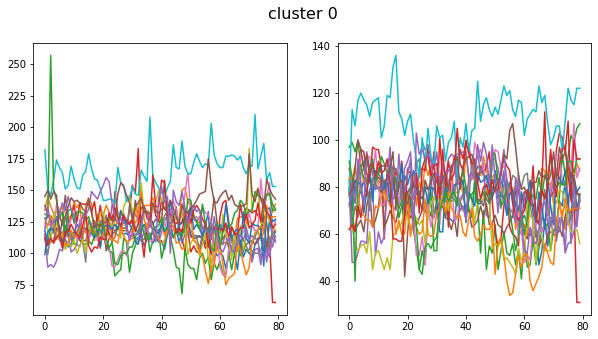

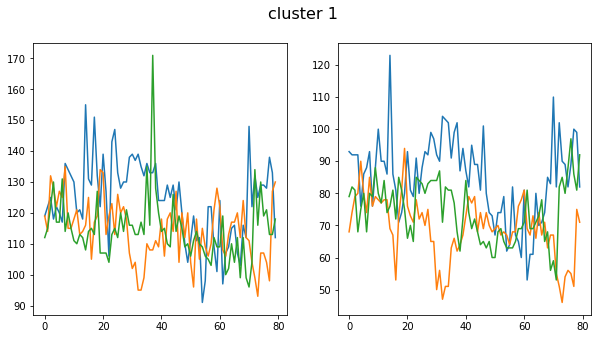

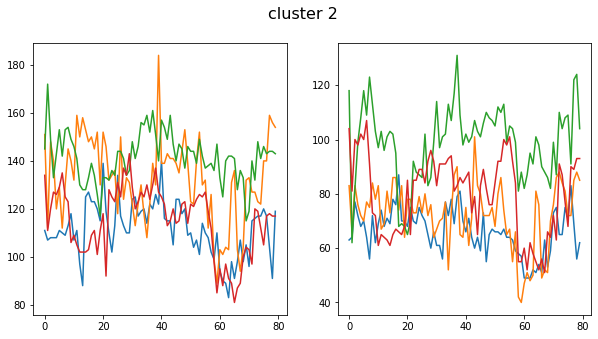

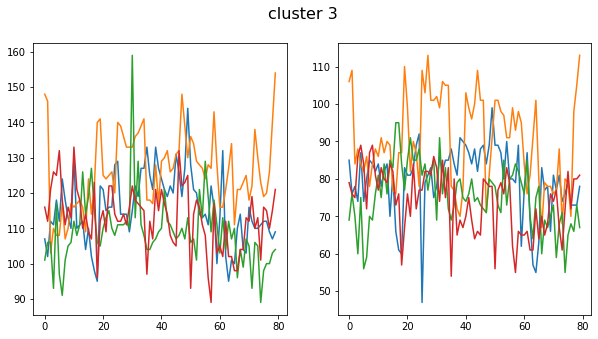

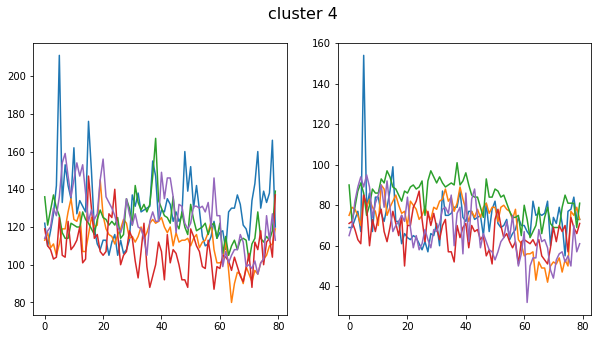

...

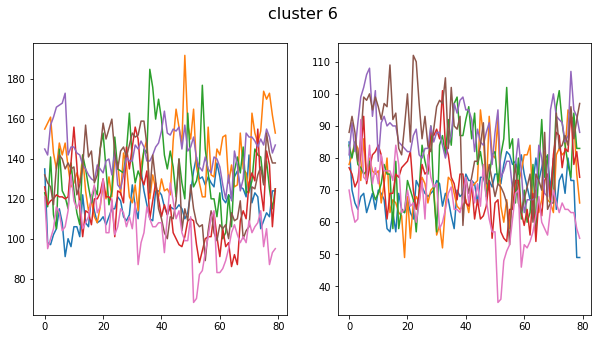

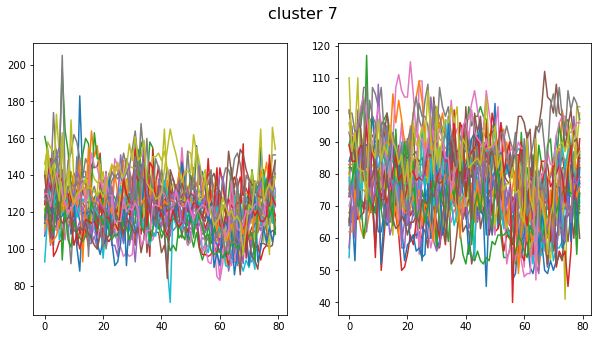

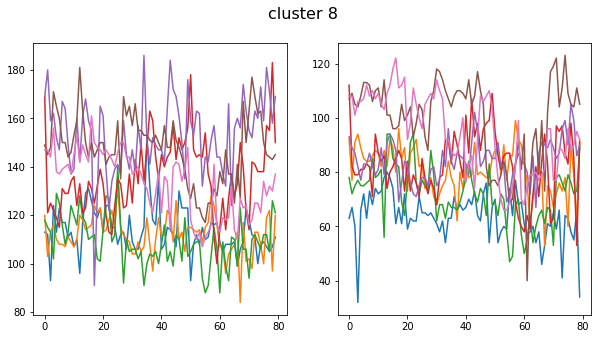

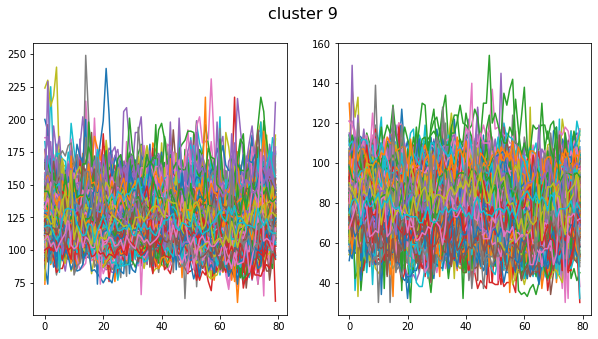

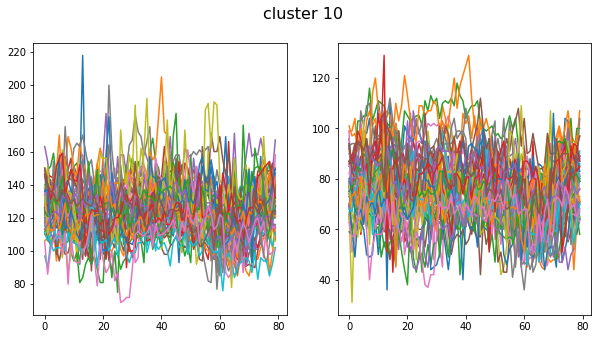

In [205]:
for i in range(len(clusters)):
    plt.figure(figsize=(10,5))
    plt.suptitle('cluster '+str(i), fontsize=16)
    plt.subplot(121)
    plt.plot(pr_train.iloc[inds[i], 0:80].T.values)

    plt.subplot(122)
    plt.plot(pr_train.iloc[inds[i], 80:].T.values)
    
    plt.show()